In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds
import rlds
from PIL import Image
import numpy as np
from tf_agents.policies import py_tf_eager_policy
import tf_agents
from tf_agents.trajectories import time_step as ts
from IPython import display
from collections import defaultdict
import matplotlib.pyplot as plt


def as_gif(images):
  # Render the images as the gif:
  images[0].save('/tmp/temp.gif', save_all=True, append_images=images[1:], duration=1000, loop=0)
  gif_bytes = open('/tmp/temp.gif','rb').read()
  return gif_bytes


2023-10-25 19:03:02.034607: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-10-25 19:03:03.262393: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-10-25 19:03:03.271867: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-25 19:03:09.137172: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/home/qyb/anaconda3/envs/rt-x/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Load TF model checkpoint
# Replace saved_model_path with path to the parent folder of
# the folder rt_1_x_tf_trained_for_002272480_step.
saved_model_path = 'rt_1_x_tf_trained_for_002272480_step'

tfa_policy = py_tf_eager_policy.SavedModelPyTFEagerPolicy(
    model_path=saved_model_path,
    load_specs_from_pbtxt=True,
    use_tf_function=True)

2023-10-25 19:03:45.307676: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 60940800 exceeds 10% of free system memory.
2023-10-25 19:03:45.513889: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 60940800 exceeds 10% of free system memory.
2023-10-25 19:03:46.225625: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 60940800 exceeds 10% of free system memory.
2023-10-25 19:03:46.333504: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 60940800 exceeds 10% of free system memory.
2023-10-25 19:03:46.784446: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 60940800 exceeds 10% of free system memory.


In [3]:
# Perform one step of inference using dummy input

# Obtain a dummy observation, where the features are all 0
observation = tf_agents.specs.zero_spec_nest(tf_agents.specs.from_spec(tfa_policy.time_step_spec.observation))

# Construct a tf_agents time_step from the dummy observation
tfa_time_step = ts.transition(observation, reward=np.zeros((), dtype=np.float32))

# Initialize the state of the policy
policy_state = tfa_policy.get_initial_state(batch_size=1)

# Run inference using the policy
action = tfa_policy.action(tfa_time_step, policy_state)

In [4]:
tfa_policy.__dict__

{'_checkpoint': <tensorflow.python.checkpoint.checkpoint.Checkpoint at 0x7f06c27b7f70>,
 '_policy': <tensorflow.python.saved_model.load.Loader._recreate_base_user_object.<locals>._UserObject at 0x7f0629d6a070>,
 '_use_tf_function': True,
 '_policy_action_fn': <tensorflow.python.eager.polymorphic_function.polymorphic_function.Function at 0x7f06293202b0>,
 '_batch_time_steps': True,
 '_time_step_spec': TimeStep(
 {'discount': BoundedArraySpec(shape=(), dtype=dtype('float32'), name='discount', minimum=0.0, maximum=1.0),
  'observation': {'image': BoundedArraySpec(shape=(256, 320, 3), dtype=dtype('uint8'), name='image', minimum=0, maximum=1),
                  'natural_language_embedding': ArraySpec(shape=(512,), dtype=dtype('float32'), name='natural_language_embedding'),
                  'natural_language_instruction': ArraySpec(shape=(), dtype=dtype('O'), name='natural_language_instruction')},
  'reward': ArraySpec(shape=(), dtype=dtype('float32'), name='reward'),
  'step_type': ArraySp

In [5]:
print("observation",observation.keys())
print("policy_state",policy_state.keys())
print("acition",action.action)

observation dict_keys(['image', 'natural_language_embedding', 'natural_language_instruction'])
policy_state dict_keys(['seq_idx', 'context_image_tokens', 'action_tokens'])
acition {'terminate_episode': array([1, 0, 0], dtype=int32), 'gripper_closedness_action': array([-0.00195694], dtype=float32), 'base_displacement_vector': array([-0.00195694, -0.00195694], dtype=float32), 'rotation_delta': array([-0.00307393, -0.00307393, -0.00307393], dtype=float32), 'base_displacement_vertical_rotation': array([-0.00614786], dtype=float32), 'world_vector': array([-0.00391388, -0.00391388, -0.00391388], dtype=float32)}


In [6]:
# Create a dataset object to obtain episode from

##builder = tfds.builder_from_directory(builder_dir='gs://gresearch/robotics/fractal20220817_data/0.1.0/')
builder = tfds.builder_from_directory(builder_dir='/home/qyb/rt/robotic-transformer-pytorch/data/')
ds = builder.as_dataset(split='train[:1]')

ds_iterator = iter(ds)

In [7]:
print(ds)

<_PrefetchDataset element_spec={'aspects': {'already_success': TensorSpec(shape=(), dtype=tf.bool, name=None), 'feasible': TensorSpec(shape=(), dtype=tf.bool, name=None), 'has_aspects': TensorSpec(shape=(), dtype=tf.bool, name=None), 'success': TensorSpec(shape=(), dtype=tf.bool, name=None), 'undesirable': TensorSpec(shape=(), dtype=tf.bool, name=None)}, 'attributes': {'collection_mode': TensorSpec(shape=(), dtype=tf.int64, name=None), 'collection_mode_name': TensorSpec(shape=(), dtype=tf.string, name=None), 'data_type': TensorSpec(shape=(), dtype=tf.int64, name=None), 'data_type_name': TensorSpec(shape=(), dtype=tf.string, name=None), 'env': TensorSpec(shape=(), dtype=tf.int64, name=None), 'env_name': TensorSpec(shape=(), dtype=tf.string, name=None), 'location': TensorSpec(shape=(), dtype=tf.int64, name=None), 'location_name': TensorSpec(shape=(), dtype=tf.string, name=None), 'objects_family': TensorSpec(shape=(), dtype=tf.int64, name=None), 'objects_family_name': TensorSpec(shape=(),

In [8]:
# Obtain the steps from one episode from the dataset

episode = next(ds_iterator)
steps = episode[rlds.STEPS]

In [9]:
print(episode.keys())
print(steps.element_spec.keys())

dict_keys(['aspects', 'attributes', 'steps'])
dict_keys(['action', 'is_first', 'is_last', 'is_terminal', 'observation', 'reward'])


115 images


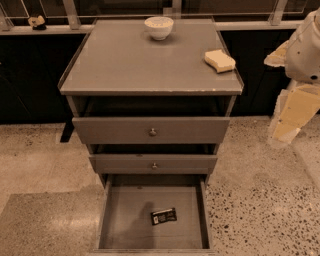

In [10]:
images = []

for step in steps:

  im = Image.fromarray(np.array(step['observation']['image']))
  images.append(im)

print(f'{len(images)} images')

display.Image(as_gif(images))

In [11]:
def resize(image):
  image = tf.image.resize_with_pad(image, target_width=320, target_height=256)
  image = tf.cast(image, tf.uint8)
  return image

def terminate_bool_to_act(terminate_episode: tf.Tensor) -> tf.Tensor:
  return tf.cond(
      terminate_episode == tf.constant(1.0),
      lambda: tf.constant([1, 0, 0], dtype=tf.int32),
      lambda: tf.constant([0, 1, 0], dtype=tf.int32),
  )

def rescale_action_with_bound(
    actions: tf.Tensor,
    low: float,
    high: float,
    safety_margin: float = 0,
    post_scaling_max: float = 1.0,
    post_scaling_min: float = -1.0,
) -> tf.Tensor:
  """Formula taken from https://stats.stackexchange.com/questions/281162/scale-a-number-between-a-range."""
  resc_actions = (actions - low) / (high - low) * (
      post_scaling_max - post_scaling_min
  ) + post_scaling_min
  return tf.clip_by_value(
      resc_actions,
      post_scaling_min + safety_margin,
      post_scaling_max - safety_margin,
  )

def rescale_action(action):
  """Rescales action."""

  action['world_vector'] = rescale_action_with_bound(
      action['world_vector'],
      low=-0.05,
      high=0.05,
      safety_margin=0.01,
      post_scaling_max=1.75,
      post_scaling_min=-1.75,
  )
  action['rotation_delta'] = rescale_action_with_bound(
      action['rotation_delta'],
      low=-0.25,
      high=0.25,
      safety_margin=0.01,
      post_scaling_max=1.4,
      post_scaling_min=-1.4,
  )

  return action

def to_model_action(from_step):
  """Convert dataset action to model action. This function is specific for the Bridge dataset."""

  model_action = {}

  model_action['world_vector'] = from_step['action']['world_vector']
  print("terminate_episode",from_step['action']['terminate_episode'])
  # model_action['terminate_episode'] = terminate_bool_to_act(
  #     from_step['action']['terminate_episode']
  # )
  model_action['terminate_episode'] = from_step['action']['terminate_episode']

  model_action['rotation_delta'] = from_step['action']['rotation_delta']

  # open_gripper = from_step['action']['open_gripper']

  # possible_values = tf.constant([True, False], dtype=tf.bool)
  # eq = tf.equal(possible_values, open_gripper)

  # assert_op = tf.Assert(tf.reduce_any(eq), [open_gripper])

  # with tf.control_dependencies([assert_op]):
  #   model_action['gripper_closedness_action'] = tf.cond(
  #       # for open_gripper in bridge dataset,
  #       # 0 is fully closed and 1 is fully open


  #       # open_gripper,



  #       # for Fractal data,
  #       # gripper_closedness_action = -1 means opening the gripper and
  #       # gripper_closedness_action = 1 means closing the gripper.
  #       lambda: tf.constant([-1.0], dtype=tf.float32),
  #       lambda: tf.constant([1.0], dtype=tf.float32),
  #   )
  model_action['gripper_closedness_action'] = from_step['action']['gripper_closedness_action']

  model_action = rescale_action(model_action)

  return model_action

In [12]:
print(observation.keys())

dict_keys(['image', 'natural_language_embedding', 'natural_language_instruction'])


In [14]:
# %%time
steps = list(steps)

policy_state = tfa_policy.get_initial_state(batch_size=1)
print(policy_state)
gt_actions = []
predicted_actions = []
images = []
observations=[]
for step in steps:

  image = resize(step[rlds.OBSERVATION]['image'])

  images.append(image)
  observation['image'] = image
  #policy_state = tfa_policy.get_initial_state(batch_size=1)
  #policy_state['seq_idx'] = np.zeros((1, 1, 1, 1, 1), dtype=np.int32)
  tfa_time_step = ts.transition(observation, reward=np.zeros((), dtype=np.float32))
  #print(dir(policy_state))
  policy_step = tfa_policy.action(tfa_time_step, policy_state)
  action = policy_step.action
  policy_state = policy_step.state

  predicted_actions.append(action)
  gt_actions.append(to_model_action(step))
  observations.append(observation["natural_language_instruction"])
  print(observation["natural_language_instruction"])

{'seq_idx': <tf.Tensor: shape=(1, 1, 1, 1, 1), dtype=int32, numpy=array([[[[[0]]]]], dtype=int32)>, 'context_image_tokens': <tf.Tensor: shape=(1, 15, 81, 1, 512), dtype=float32, numpy=
array([[[[[0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.]],

         ...,

         [[0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.]]],


        [[[0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.]],

         ...,

         [[0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.]]],


        [[[0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.]],

         ...,

         [[0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0.,

terminate_episode tf.Tensor([0 1 0], shape=(3,), dtype=int32)
tf.Tensor(b'', shape=(), dtype=string)
terminate_episode tf.Tensor([0 1 0], shape=(3,), dtype=int32)
tf.Tensor(b'', shape=(), dtype=string)
terminate_episode tf.Tensor([0 1 0], shape=(3,), dtype=int32)
tf.Tensor(b'', shape=(), dtype=string)
terminate_episode tf.Tensor([0 1 0], shape=(3,), dtype=int32)
tf.Tensor(b'', shape=(), dtype=string)
terminate_episode tf.Tensor([0 1 0], shape=(3,), dtype=int32)
tf.Tensor(b'', shape=(), dtype=string)
terminate_episode tf.Tensor([0 1 0], shape=(3,), dtype=int32)
tf.Tensor(b'', shape=(), dtype=string)
terminate_episode tf.Tensor([0 1 0], shape=(3,), dtype=int32)
tf.Tensor(b'', shape=(), dtype=string)
terminate_episode tf.Tensor([0 1 0], shape=(3,), dtype=int32)
tf.Tensor(b'', shape=(), dtype=string)
terminate_episode tf.Tensor([0 1 0], shape=(3,), dtype=int32)
tf.Tensor(b'', shape=(), dtype=string)
terminate_episode tf.Tensor([0 1 0], shape=(3,), dtype=int32)
tf.Tensor(b'', shape=(), dtyp

In [2]:
observations

NameError: name 'observations' is not defined

In [23]:
x = tf.constant(b'Hello World!')
print(x)
# 转换为普通字符串并打印
print(x.numpy().decode())

tf.Tensor(b'Hello World!', shape=(), dtype=string)
Hello World!


In [ ]:
print(predicted_actions[1]["world_vector"] )

[ 0.09001946  0.12133074 -0.2152642 ]


In [ ]:
action_name_to_values_over_time = defaultdict(list)
predicted_action_name_to_values_over_time = defaultdict(list)
figure_layout = ['terminate_episode_0', 'terminate_episode_1',
        'terminate_episode_2', 'world_vector_0', 'world_vector_1',
        'world_vector_2', 'rotation_delta_0', 'rotation_delta_1',
        'rotation_delta_2', 'gripper_closedness_action_0']
action_order = ['terminate_episode', 'world_vector', 'rotation_delta', 'gripper_closedness_action']

for i, action in enumerate(gt_actions):

  for action_name in action_order:

    for action_sub_dimension in range(action[action_name].shape[0]):

      # print(action_name, action_sub_dimension)
      title = f'{action_name}_{action_sub_dimension}'

      action_name_to_values_over_time[title].append(action[action_name][action_sub_dimension])
      predicted_action_name_to_values_over_time[title].append(predicted_actions[i][action_name][action_sub_dimension])

In [ ]:
figure_layout = [
    ['image'] * len(figure_layout),
    figure_layout
]


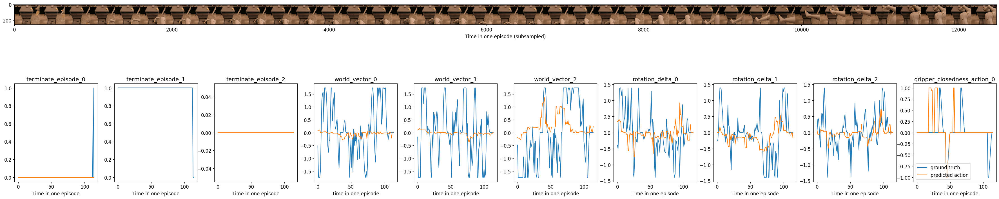

In [ ]:
plt.rcParams.update({'font.size': 12})

stacked = tf.concat(tf.unstack(images[::3], axis=0), 1)

fig, axs = plt.subplot_mosaic(figure_layout)
fig.set_size_inches([45, 10])

for i, (k, v) in enumerate(action_name_to_values_over_time.items()):

  axs[k].plot(v, label='ground truth')
  axs[k].plot(predicted_action_name_to_values_over_time[k], label='predicted action')
  axs[k].set_title(k)
  axs[k].set_xlabel('Time in one episode')

axs['image'].imshow(stacked.numpy())
axs['image'].set_xlabel('Time in one episode (subsampled)')

plt.legend()
